# Imports

In [143]:
import pandas as pd
import numpy as np
import math
import folium
from folium.plugins import HeatMap
from branca.colormap import linear
import geopandas as gpd
from shapely.geometry import Point
from sklearn.preprocessing import StandardScaler, MultiLabelBinarizer, LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from folium.plugins import HeatMap
from branca.colormap import linear
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns


# Initialize Variables

In [144]:
df_list = ['dfmajorcrimes', 'dfhomicidies']

# Data Loading

In [145]:
def show_all_columns(df):
    with pd.option_context('display.max_columns', None):
        display(df)
def show_all_rows(df):
    with pd.option_context('display.max_rows', None):
        display(df)

In [146]:
dfmajorcrimes = pd.read_csv('raw_data/majorcrimes.csv')
dfhomicides = pd.read_csv('raw_data/homicidies.csv')


In [147]:
# Define the target columns including the ones that need to be added
columns = ['EVENT_UNIQUE_ID','DATASET','OFFENCE', 'MCI_CATEGORY','OCC_HOUR','OCC_DAY','OCC_MONTH','OCC_YEAR','OCC_DOW','OCC_DOY','LAT_WGS84','LONG_WGS84']

# Add missing columns with default values
for df in [dfhomicides, dfmajorcrimes]:
    for column in columns:
        if column not in df.columns:
            df[column] = None

# Select columns in the specified order for all DataFrames
dfhomicides_s = dfhomicides[columns]
dfmajorcrimes_s = dfmajorcrimes[columns]

# Set the 'DATASET' column for each DataFrame using .loc to avoid SettingWithCopyWarning
dfhomicides_s.loc[:, 'DATASET'] = 'HOMICIDES'
dfmajorcrimes_s.loc[:, 'DATASET'] = 'MAJOR_CRIMES'

# Concatenate the DataFrames into a single DataFrame
dfmatrix = pd.concat([dfhomicides_s, dfmajorcrimes_s], ignore_index=True)

# Display the resulting DataFrame
dfmatrix

,EVENT_UNIQUE_ID,DATASET,OFFENCE,MCI_CATEGORY,OCC_HOUR,OCC_DAY,OCC_MONTH,OCC_YEAR,OCC_DOW,OCC_DOY,LAT_WGS84,LONG_WGS84
0,GO-2004111878,HOMICIDES,None,None,None,3.0,January,2004.0,Saturday,3.0,43.685026,-79.392828
1,GO-2004125755,HOMICIDES,None,None,None,8.0,January,2004.0,Thursday,8.0,43.781782,-79.233852
2,GO-2004136086,HOMICIDES,None,None,None,8.0,January,2004.0,Thursday,8.0,43.810544,-79.205574
3,GO-2004148623,HOMICIDES,None,None,None,25.0,January,2004.0,Sunday,25.0,43.670467,-79.434387
4,GO-2004148619,HOMICIDES,None,None,None,25.0,January,2004.0,Sunday,25.0,43.822997,-79.204958
...,...,...,...,...,...,...,...,...,...,...,...,...
386096,GO-2024688981,MAJOR_CRIMES,Theft Of Motor Vehicle,Auto Theft,16,30.0,March,2024.0,Saturday,90.0,43.755641,-79.196001
386097,GO-2024690900,MAJOR_CRIMES,Assault,Assault,16,31.0,March,2024.0,Sunday,91.0,43.595354,-79.529766
386098,GO-2024690985,MAJOR_CRIMES,Assault,Assault,16,31.0,March,2024.0,Sunday,91.0,43.688644,-79.391479
386099,GO-2024690995,MAJOR_CRIMES,Theft Of Motor Vehicle,Auto Theft,23,30.0,March,2024.0,Saturday,90.0,43.684335,-79.372581


In [148]:
dfmatrix.loc[dfmatrix['DATASET'] == 'HOMICIDES', 'OFFENCE'] = 'Homicide'
dfmatrix.loc[dfmatrix['DATASET'] == 'HOMICIDES', 'MCI_CATEGORY'] = 'Homicide'
dfmatrix

,EVENT_UNIQUE_ID,DATASET,OFFENCE,MCI_CATEGORY,OCC_HOUR,OCC_DAY,OCC_MONTH,OCC_YEAR,OCC_DOW,OCC_DOY,LAT_WGS84,LONG_WGS84
0,GO-2004111878,HOMICIDES,Homicide,Homicide,None,3.0,January,2004.0,Saturday,3.0,43.685026,-79.392828
1,GO-2004125755,HOMICIDES,Homicide,Homicide,None,8.0,January,2004.0,Thursday,8.0,43.781782,-79.233852
2,GO-2004136086,HOMICIDES,Homicide,Homicide,None,8.0,January,2004.0,Thursday,8.0,43.810544,-79.205574
3,GO-2004148623,HOMICIDES,Homicide,Homicide,None,25.0,January,2004.0,Sunday,25.0,43.670467,-79.434387
4,GO-2004148619,HOMICIDES,Homicide,Homicide,None,25.0,January,2004.0,Sunday,25.0,43.822997,-79.204958
...,...,...,...,...,...,...,...,...,...,...,...,...
386096,GO-2024688981,MAJOR_CRIMES,Theft Of Motor Vehicle,Auto Theft,16,30.0,March,2024.0,Saturday,90.0,43.755641,-79.196001
386097,GO-2024690900,MAJOR_CRIMES,Assault,Assault,16,31.0,March,2024.0,Sunday,91.0,43.595354,-79.529766
386098,GO-2024690985,MAJOR_CRIMES,Assault,Assault,16,31.0,March,2024.0,Sunday,91.0,43.688644,-79.391479
386099,GO-2024690995,MAJOR_CRIMES,Theft Of Motor Vehicle,Auto Theft,23,30.0,March,2024.0,Saturday,90.0,43.684335,-79.372581


# Data Cleaning and Transformation

In [149]:
# checking for latitude and longitude errors

# Toronto boundaries
north_boundary = 43.8554
south_boundary = 43.5810
east_boundary = -79.1161
west_boundary = -79.6393


# Check if latitude and longitude are within the boundaries
within_boundaries = (dfmatrix['LAT_WGS84'] <= north_boundary) & (dfmatrix['LAT_WGS84'] >= south_boundary) & \
                    (dfmatrix['LONG_WGS84'] >= west_boundary) & (dfmatrix['LONG_WGS84'] <= east_boundary)

# Filter the DataFrame
dfmatrix = dfmatrix.loc[within_boundaries].reset_index(drop=True)
dfmatrix

,EVENT_UNIQUE_ID,DATASET,OFFENCE,MCI_CATEGORY,OCC_HOUR,OCC_DAY,OCC_MONTH,OCC_YEAR,OCC_DOW,OCC_DOY,LAT_WGS84,LONG_WGS84
0,GO-2004111878,HOMICIDES,Homicide,Homicide,None,3.0,January,2004.0,Saturday,3.0,43.685026,-79.392828
1,GO-2004125755,HOMICIDES,Homicide,Homicide,None,8.0,January,2004.0,Thursday,8.0,43.781782,-79.233852
2,GO-2004136086,HOMICIDES,Homicide,Homicide,None,8.0,January,2004.0,Thursday,8.0,43.810544,-79.205574
3,GO-2004148623,HOMICIDES,Homicide,Homicide,None,25.0,January,2004.0,Sunday,25.0,43.670467,-79.434387
4,GO-2004148619,HOMICIDES,Homicide,Homicide,None,25.0,January,2004.0,Sunday,25.0,43.822997,-79.204958
...,...,...,...,...,...,...,...,...,...,...,...,...
380240,GO-2024688981,MAJOR_CRIMES,Theft Of Motor Vehicle,Auto Theft,16,30.0,March,2024.0,Saturday,90.0,43.755641,-79.196001
380241,GO-2024690900,MAJOR_CRIMES,Assault,Assault,16,31.0,March,2024.0,Sunday,91.0,43.595354,-79.529766
380242,GO-2024690985,MAJOR_CRIMES,Assault,Assault,16,31.0,March,2024.0,Sunday,91.0,43.688644,-79.391479
380243,GO-2024690995,MAJOR_CRIMES,Theft Of Motor Vehicle,Auto Theft,23,30.0,March,2024.0,Saturday,90.0,43.684335,-79.372581


In [150]:
# Display NA values

# Boolean mask where OCC_HOUR is NA
na_mask = dfmatrix['OCC_HOUR'].isna()

# Mask to filter the DataFrame
na_rows = dfmatrix[na_mask]

# Display the rows with NA values in OCC_HOUR column
na_rows

,EVENT_UNIQUE_ID,DATASET,OFFENCE,MCI_CATEGORY,OCC_HOUR,OCC_DAY,OCC_MONTH,OCC_YEAR,OCC_DOW,OCC_DOY,LAT_WGS84,LONG_WGS84
0,GO-2004111878,HOMICIDES,Homicide,Homicide,None,3.0,January,2004.0,Saturday,3.0,43.685026,-79.392828
1,GO-2004125755,HOMICIDES,Homicide,Homicide,None,8.0,January,2004.0,Thursday,8.0,43.781782,-79.233852
2,GO-2004136086,HOMICIDES,Homicide,Homicide,None,8.0,January,2004.0,Thursday,8.0,43.810544,-79.205574
3,GO-2004148623,HOMICIDES,Homicide,Homicide,None,25.0,January,2004.0,Sunday,25.0,43.670467,-79.434387
4,GO-2004148619,HOMICIDES,Homicide,Homicide,None,25.0,January,2004.0,Sunday,25.0,43.822997,-79.204958
...,...,...,...,...,...,...,...,...,...,...,...,...
1409,GO-2024545700,HOMICIDES,Homicide,Homicide,None,12.0,March,2024.0,Tuesday,72.0,43.659103,-79.364238
1410,GO-2024545700,HOMICIDES,Homicide,Homicide,None,12.0,March,2024.0,Tuesday,72.0,43.659103,-79.364238
1411,GO-2024558575,HOMICIDES,Homicide,Homicide,None,14.0,March,2024.0,Thursday,74.0,43.745156,-79.208993
1412,GO-2024671809,HOMICIDES,Homicide,Homicide,None,28.0,March,2024.0,Thursday,88.0,43.768847,-79.466916


### OCC_HOUR Column

In [151]:
df_hour = dfmatrix[dfmatrix['DATASET']== 'MAJOR_CRIMES'].OCC_HOUR.value_counts()/len(dfmatrix[dfmatrix['DATASET']== 'MAJOR_CRIMES'])
df_hour

OCC_HOUR
0     0.069181
21    0.054481
12    0.054288
20    0.054272
18    0.054214
22    0.053892
23    0.052298
19    0.052179
17    0.050117
15    0.048177
16    0.046306
14    0.041018
1     0.040786
2     0.040556
13    0.038138
11    0.035145
3     0.033749
10    0.033440
9     0.032930
8     0.028205
4     0.027144
5     0.020833
7     0.020669
6     0.017982
Name: count, dtype: float64

In [152]:
df_hour = df_hour.to_frame().reset_index(drop=False)

df_hour

,OCC_HOUR,count
0,0,0.069181
1,21,0.054481
2,12,0.054288
3,20,0.054272
4,18,0.054214
5,22,0.053892
6,23,0.052298
7,19,0.052179
8,17,0.050117
9,15,0.048177


In [153]:
import math

for i, hour_row in df_hour.iterrows():
    size = len(dfmatrix[dfmatrix['DATASET']=='HOMICIDES'])
    for index, row in dfmatrix[((dfmatrix['DATASET']=='HOMICIDES') & (pd.isnull(dfmatrix.OCC_HOUR)))].head(math.trunc(size*hour_row['count'])).iterrows():
        dfmatrix.loc[index, 'OCC_HOUR'] = hour_row['OCC_HOUR']

In [154]:
len(dfmatrix[pd.isnull(dfmatrix['OCC_HOUR'])])

14

In [155]:
# Again for the 14 remainders still showing as Nan

for i, hour_row in df_hour.iterrows():
    size = len(dfmatrix[dfmatrix['DATASET']=='HOMICIDES'])
    for index, row in dfmatrix[((dfmatrix['DATASET']=='HOMICIDES') & (pd.isnull(dfmatrix.OCC_HOUR)))].head(math.trunc(size*hour_row['count'])).iterrows():
        dfmatrix.loc[index, 'OCC_HOUR'] = hour_row['OCC_HOUR']

In [156]:
len(dfmatrix[pd.isnull(dfmatrix['OCC_HOUR'])])

0

In [157]:
dfmatrix['OCC_HOUR'] = pd.to_numeric(dfmatrix['OCC_HOUR'], errors='coerce').fillna(0).astype(int)

In [158]:
# Apply np.floor and convert to int, while handling NaN values
dfmatrix['OCC_HOUR'] = dfmatrix['OCC_HOUR'].apply(lambda x: np.floor(x) if pd.notnull(x) else x).astype('Int64')

### Fixing OCC_DAY

In [159]:
#  Converting OCC_DAY from float to int
dfmatrix['OCC_DAY'] = pd.to_numeric(dfmatrix['OCC_DAY'], errors='coerce').fillna(0).astype(int)

In [160]:
# Apply np.floor and convert to int, while handling NaN values
dfmatrix['OCC_DAY'] = dfmatrix['OCC_DAY'].apply(lambda x: np.floor(x) if pd.notnull(x) else x).astype('Int64')

In [161]:
# Filter the DataFrame for non-zero OCC_DAY values
df_occ_day_non_zero = dfmatrix[dfmatrix['OCC_DAY'] != 0]

# Calculate the value counts and normalize them
occ_day_proportions = df_occ_day_non_zero['OCC_DAY'].value_counts(normalize=True).reset_index()
occ_day_proportions.columns = ['OCC_DAY', 'proportion']

# Total number of rows where OCC_DAY is 0
total_zeros = (dfmatrix['OCC_DAY'] == 0).sum()

# Track the index of the current proportion
current_proportion_index = 0

# Iterate over the rows where OCC_DAY is 0 and update OCC_DAY based on proportions
for index, row in dfmatrix[dfmatrix['OCC_DAY'] == 0].iterrows():
    # Get the current proportion
    current_proportion = occ_day_proportions.at[current_proportion_index, 'OCC_DAY']

    # Update OCC_DAY for the current row
    dfmatrix.at[index, 'OCC_DAY'] = current_proportion

    # Update the current proportion index
    current_proportion_index += 1

    # If we reach the end of the proportions, reset the index
    if current_proportion_index >= len(occ_day_proportions):
        current_proportion_index = 0

In [162]:
# Dropping the zero rows
# Total number of rows
total_rows = len(dfmatrix)

# Number of rows where OCC_DAY is 0
occ_day_zeros = (dfmatrix['OCC_DAY'] == 0).sum()

# Proportion of rows where OCC_DAY is 0
proportion_occ_day_zeros = occ_day_zeros / total_rows

print(f"Total rows: {total_rows}")
print(f"Rows with OCC_DAY = 0: {occ_day_zeros}")
print(f"Proportion of rows with OCC_DAY = 0: {proportion_occ_day_zeros:.2%}")

Total rows: 380245
Rows with OCC_DAY = 0: 0
Proportion of rows with OCC_DAY = 0: 0.00%


### OCC_DAY E DOY para Sin e COS


In [163]:
dfmatrix['OCC_DAY_SIN'] = np.sin(2 * np.pi * dfmatrix['OCC_DAY'] / 24)
dfmatrix['OCC_DAY_COS'] = np.cos(2 * np.pi * dfmatrix['OCC_DAY'] / 24)

dfmatrix['OCC_DOY_SIN'] = np.sin(2 * np.pi * dfmatrix['OCC_DOY'] / 24)
dfmatrix['OCC_DOY_COS'] = np.cos(2 * np.pi * dfmatrix['OCC_DOY'] / 24)

### OCC_MONTH

In [164]:
dfmatrix = dfmatrix.dropna(subset=['OCC_MONTH'])

In [165]:
months = {'January':1,
          'February': 2,
          'March': 3,
          'April':4,
          'May': 5,
          'June': 6,
          'July': 7,
          'August': 8,
          'September': 9,
          'October': 10,
          'November': 11,
          'December': 12}

In [166]:
dfmatrix['OCC_MONTH_NUM'] = dfmatrix.OCC_MONTH.apply(lambda x: months[x])

/var/folders/33/7yzzx5qj4hq4pqr3jnrjz3mh0000gn/T/ipykernel_29838/3486876624.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfmatrix['OCC_MONTH_NUM'] = dfmatrix.OCC_MONTH.apply(lambda x: months[x])


In [167]:
# Apply sine and cosine transformations
dfmatrix['MONTH_SIN'] = np.sin(2 * np.pi * dfmatrix['OCC_MONTH_NUM'] / 12)
dfmatrix['MONTH_COS'] = np.cos(2 * np.pi * dfmatrix['OCC_MONTH_NUM'] / 12)
dfmatrix['HOUR_SIN'] = np.sin(2 * np.pi * dfmatrix['OCC_HOUR'] / 24)
dfmatrix['HOUR_COS'] = np.cos(2 * np.pi * dfmatrix['OCC_HOUR'] / 24)

/var/folders/33/7yzzx5qj4hq4pqr3jnrjz3mh0000gn/T/ipykernel_29838/2780489690.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfmatrix['MONTH_SIN'] = np.sin(2 * np.pi * dfmatrix['OCC_MONTH_NUM'] / 12)
/var/folders/33/7yzzx5qj4hq4pqr3jnrjz3mh0000gn/T/ipykernel_29838/2780489690.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfmatrix['MONTH_COS'] = np.cos(2 * np.pi * dfmatrix['OCC_MONTH_NUM'] / 12)
/var/folders/33/7yzzx5qj4hq4pqr3jnrjz3mh0000gn/T/ipykernel_29838/2780489690.py:4: SettingWithCopyWarning: 

In [168]:
days_of_week = {'Friday': 6,
                'Saturday': 7,
                'Sunday': 1,
                'Thursday': 5,
                'Wednesday': 4,
                'Monday': 2,
                'Tuesday': 3}

dfmatrix['OCC_DOW_NUM'] = dfmatrix.OCC_DOW.apply(lambda x: days_of_week[x.strip()])

dfmatrix['OCC_DOW_SIN'] = np.sin(2 * np.pi * dfmatrix['OCC_DOW_NUM'] / 24)
dfmatrix['OCC_DOW_COS'] = np.cos(2 * np.pi * dfmatrix['OCC_DOW_NUM'] / 24)

/var/folders/33/7yzzx5qj4hq4pqr3jnrjz3mh0000gn/T/ipykernel_29838/909300920.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfmatrix['OCC_DOW_NUM'] = dfmatrix.OCC_DOW.apply(lambda x: days_of_week[x.strip()])
/var/folders/33/7yzzx5qj4hq4pqr3jnrjz3mh0000gn/T/ipykernel_29838/909300920.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfmatrix['OCC_DOW_SIN'] = np.sin(2 * np.pi * dfmatrix['OCC_DOW_NUM'] / 24)
/var/folders/33/7yzzx5qj4hq4pqr3jnrjz3mh0000gn/T/ipykernel_29838/909300920.py:12: SettingWithCopyW

In [169]:
dfmatrix.loc['OCC_YEAR'] = pd.to_numeric(dfmatrix['OCC_YEAR'], errors='raise').fillna(0).astype(int)

/var/folders/33/7yzzx5qj4hq4pqr3jnrjz3mh0000gn/T/ipykernel_29838/223081176.py:1: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  dfmatrix.loc['OCC_YEAR'] = pd.to_numeric(dfmatrix['OCC_YEAR'], errors='raise').fillna(0).astype(int)
/var/folders/33/7yzzx5qj4hq4pqr3jnrjz3mh0000gn/T/ipykernel_29838/223081176.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfmatrix.loc['OCC_YEAR'] = pd.to_numeric(dfmatrix['OCC_YEAR'], errors='raise').fillna(0).astype(int)


In [170]:
dfmatrix.loc['OCC_YEAR'] = pd.to_numeric(dfmatrix['OCC_YEAR'], errors='raise').fillna(0).astype(int)

### OCC_YEAR

In [171]:
dfmatrix = dfmatrix.dropna(subset=['OCC_YEAR'])

In [172]:
# Apply np.floor and convert to int, while handling NaN values
dfmatrix['OCC_YEAR'] = dfmatrix['OCC_YEAR'].apply(lambda x: np.floor(x) if pd.notnull(x) else x).astype('Int64')

In [173]:
# Filter rows where 'OCC_YEAR' is 2014 or later
dfmatrix = dfmatrix[dfmatrix['OCC_YEAR'] >= 2014]

### Dropping unnecessary columns

In [174]:
# List of columns to drop
columns_to_drop = ['DATASET', 'OFFENCE', 'DIVISION', 'HOOD_140', 'NEIGHBOURHOOD_140', 'HOOD_158', 'NEIGHBOURHOOD_158']

# Filter the list to include only existing columns in the DataFrame
existing_columns_to_drop = [col for col in columns_to_drop if col in dfmatrix.columns]

# Drop the existing columns
dfmatrix = dfmatrix.drop(columns=existing_columns_to_drop)

In [175]:
# Drop rows with NaN values
dfmatrix = dfmatrix.dropna(subset=['OCC_DOY'])

# Now convert the column to integers
dfmatrix['OCC_DOY'] = dfmatrix['OCC_DOY'].astype(int)

In [176]:
dfmatrix.head()

,EVENT_UNIQUE_ID,MCI_CATEGORY,OCC_HOUR,OCC_DAY,OCC_MONTH,OCC_YEAR,OCC_DOW,OCC_DOY,LAT_WGS84,LONG_WGS84,...,OCC_DOY_SIN,OCC_DOY_COS,OCC_MONTH_NUM,MONTH_SIN,MONTH_COS,HOUR_SIN,HOUR_COS,OCC_DOW_NUM,OCC_DOW_SIN,OCC_DOW_COS
662,GO-20141272537,Homicide,17,3,January,2014,Friday,3,43.667288,-79.373767,...,0.707107,7.071068e-01,1.0,0.5,0.866025,-0.965926,-0.258819,6.0,1.000000,6.123234e-17
663,GO-20141326860,Homicide,17,14,January,2014,Tuesday,14,43.759140,-79.289604,...,-0.500000,-8.660254e-01,1.0,0.5,0.866025,-0.965926,-0.258819,3.0,0.707107,7.071068e-01
664,GO-20141431240,Homicide,17,29,January,2014,Wednesday,29,43.769478,-79.220423,...,0.965926,2.588190e-01,1.0,0.5,0.866025,-0.965926,-0.258819,4.0,0.866025,5.000000e-01
665,GO-20141428622,Homicide,17,29,January,2014,Wednesday,29,43.694614,-79.517334,...,0.965926,2.588190e-01,1.0,0.5,0.866025,-0.965926,-0.258819,4.0,0.866025,5.000000e-01
666,GO-20141435425,Homicide,17,30,January,2014,Thursday,30,43.654318,-79.378757,...,1.000000,1.194340e-15,1.0,0.5,0.866025,-0.965926,-0.258819,5.0,0.965926,2.588190e-01


### Prepare for geographic data

In [177]:
# Prepare geographic data
df['geometry'] = dfmatrix.apply(lambda row: Point(row['LONG_WGS84'], row['LAT_WGS84']), axis=1)
geo_df = gpd.GeoDataFrame(df, geometry='geometry')

# Drop rows with missing coordinates
geo_df = geo_df.dropna(subset=['LAT_WGS84', 'LONG_WGS84'])

In [178]:
geo_df

,X,Y,OBJECTID,EVENT_UNIQUE_ID,REPORT_DATE,OCC_DATE,REPORT_YEAR,REPORT_MONTH,REPORT_DAY,REPORT_DOY,...,OFFENCE,MCI_CATEGORY,HOOD_158,NEIGHBOURHOOD_158,HOOD_140,NEIGHBOURHOOD_140,LONG_WGS84,LAT_WGS84,DATASET,geometry
0,-8.841785e+06,5.410286e+06,1,GO-20141260127,2014/01/01 05:00:00+00,2014/01/01 05:00:00+00,2014,January,1,1,...,Assault Bodily Harm,Assault,84,Little Portugal,84,Little Portugal (84),-79.427105,43.642517,None,None
1,-8.838126e+06,5.412178e+06,2,GO-20141263725,2014/01/01 05:00:00+00,2014/01/01 05:00:00+00,2014,January,1,1,...,Assault With Weapon,Assault,78,Kensington-Chinatown,78,Kensington-Chinatown (78),-79.394234,43.654811,None,None
2,-8.841053e+06,5.409639e+06,3,GO-20141264272,2014/01/01 05:00:00+00,2014/01/01 05:00:00+00,2014,January,1,1,...,Assault With Weapon,Assault,85,South Parkdale,85,South Parkdale (85),-79.420532,43.638306,None,None
3,-8.850461e+06,5.420267e+06,4,GO-20141263706,2014/01/01 05:00:00+00,2014/01/01 05:00:00+00,2014,January,1,1,...,Assault,Assault,113,Weston,113,Weston (113),-79.505043,43.707365,None,None
4,-8.840470e+06,5.431266e+06,5,GO-20141263710,2014/01/01 05:00:00+00,2014/01/01 05:00:00+00,2014,January,1,1,...,Assault,Assault,151,Yonge-Doris,51,Willowdale East (51),-79.415293,43.778743,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
384682,-8.816058e+06,5.427705e+06,384683,GO-2024688981,2024/03/31 04:00:00+00,2024/03/30 04:00:00+00,2024,March,31,91,...,Theft Of Motor Vehicle,Auto Theft,136,West Hill,136,West Hill (136),-79.196001,43.755641,None,None
384683,-8.853213e+06,5.403034e+06,384684,GO-2024690900,2024/03/31 04:00:00+00,2024/03/31 04:00:00+00,2024,March,31,91,...,Assault,Assault,19,Long Branch,19,Long Branch (19),-79.529766,43.595354,None,None
384684,-8.837819e+06,5.417385e+06,384685,GO-2024690985,2024/03/31 04:00:00+00,2024/03/31 04:00:00+00,2024,March,31,91,...,Assault,Assault,98,Rosedale-Moore Park,98,Rosedale-Moore Park (98),-79.391479,43.688644,None,None
384685,-8.835715e+06,5.416722e+06,384686,GO-2024690995,2024/03/31 04:00:00+00,2024/03/30 04:00:00+00,2024,March,31,91,...,Theft Of Motor Vehicle,Auto Theft,98,Rosedale-Moore Park,98,Rosedale-Moore Park (98),-79.372581,43.684335,None,None


### Drop Rows with NaN values and conversion of collumns to integers

In [179]:
# Drop rows with NaN values
dfmatrix = dfmatrix.dropna(subset=['OCC_DOY'])

# Now convert the column to integers
dfmatrix['OCC_DOY'] = dfmatrix['OCC_DOY'].astype(int)

# Drop rows with NaN values²
dfmatrix = dfmatrix.dropna(subset=['OCC_MONTH_NUM'])
# Now convert the column to integers²
dfmatrix['OCC_MONTH_NUM'] = dfmatrix['OCC_MONTH_NUM'].astype(int)

In [180]:
show_all_columns(dfmatrix)

,EVENT_UNIQUE_ID,MCI_CATEGORY,OCC_HOUR,OCC_DAY,OCC_MONTH,OCC_YEAR,OCC_DOW,OCC_DOY,LAT_WGS84,LONG_WGS84,OCC_DAY_SIN,OCC_DAY_COS,OCC_DOY_SIN,OCC_DOY_COS,OCC_MONTH_NUM,MONTH_SIN,MONTH_COS,HOUR_SIN,HOUR_COS,OCC_DOW_NUM,OCC_DOW_SIN,OCC_DOW_COS
662,GO-20141272537,Homicide,17,3,January,2014,Friday,3,43.667288,-79.373767,0.707107,0.707107,0.707107,7.071068e-01,1,0.5,8.660254e-01,-0.965926,-0.258819,6.0,1.000000,6.123234e-17
663,GO-20141326860,Homicide,17,14,January,2014,Tuesday,14,43.759140,-79.289604,-0.5,-0.866025,-0.500000,-8.660254e-01,1,0.5,8.660254e-01,-0.965926,-0.258819,3.0,0.707107,7.071068e-01
664,GO-20141431240,Homicide,17,29,January,2014,Wednesday,29,43.769478,-79.220423,0.965926,0.258819,0.965926,2.588190e-01,1,0.5,8.660254e-01,-0.965926,-0.258819,4.0,0.866025,5.000000e-01
665,GO-20141428622,Homicide,17,29,January,2014,Wednesday,29,43.694614,-79.517334,0.965926,0.258819,0.965926,2.588190e-01,1,0.5,8.660254e-01,-0.965926,-0.258819,4.0,0.866025,5.000000e-01
666,GO-20141435425,Homicide,17,30,January,2014,Thursday,30,43.654318,-79.378757,1.0,0.0,1.000000,1.194340e-15,1,0.5,8.660254e-01,-0.965926,-0.258819,5.0,0.965926,2.588190e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
380240,GO-2024688981,Auto Theft,16,30,March,2024,Saturday,90,43.755641,-79.196001,1.0,0.0,-1.000000,8.578717e-16,3,1.0,6.123234e-17,-0.866025,-0.5,7.0,0.965926,-2.588190e-01
380241,GO-2024690900,Assault,16,31,March,2024,Sunday,91,43.595354,-79.529766,0.965926,-0.258819,-0.965926,2.588190e-01,3,1.0,6.123234e-17,-0.866025,-0.5,1.0,0.258819,9.659258e-01
380242,GO-2024690985,Assault,16,31,March,2024,Sunday,91,43.688644,-79.391479,0.965926,-0.258819,-0.965926,2.588190e-01,3,1.0,6.123234e-17,-0.866025,-0.5,1.0,0.258819,9.659258e-01
380243,GO-2024690995,Auto Theft,23,30,March,2024,Saturday,90,43.684335,-79.372581,1.0,0.0,-1.000000,8.578717e-16,3,1.0,6.123234e-17,-0.258819,0.965926,7.0,0.965926,-2.588190e-01


In [181]:
show_all_columns(dfmatrix)

,EVENT_UNIQUE_ID,MCI_CATEGORY,OCC_HOUR,OCC_DAY,OCC_MONTH,OCC_YEAR,OCC_DOW,OCC_DOY,LAT_WGS84,LONG_WGS84,OCC_DAY_SIN,OCC_DAY_COS,OCC_DOY_SIN,OCC_DOY_COS,OCC_MONTH_NUM,MONTH_SIN,MONTH_COS,HOUR_SIN,HOUR_COS,OCC_DOW_NUM,OCC_DOW_SIN,OCC_DOW_COS
662,GO-20141272537,Homicide,17,3,January,2014,Friday,3,43.667288,-79.373767,0.707107,0.707107,0.707107,7.071068e-01,1,0.5,8.660254e-01,-0.965926,-0.258819,6.0,1.000000,6.123234e-17
663,GO-20141326860,Homicide,17,14,January,2014,Tuesday,14,43.759140,-79.289604,-0.5,-0.866025,-0.500000,-8.660254e-01,1,0.5,8.660254e-01,-0.965926,-0.258819,3.0,0.707107,7.071068e-01
664,GO-20141431240,Homicide,17,29,January,2014,Wednesday,29,43.769478,-79.220423,0.965926,0.258819,0.965926,2.588190e-01,1,0.5,8.660254e-01,-0.965926,-0.258819,4.0,0.866025,5.000000e-01
665,GO-20141428622,Homicide,17,29,January,2014,Wednesday,29,43.694614,-79.517334,0.965926,0.258819,0.965926,2.588190e-01,1,0.5,8.660254e-01,-0.965926,-0.258819,4.0,0.866025,5.000000e-01
666,GO-20141435425,Homicide,17,30,January,2014,Thursday,30,43.654318,-79.378757,1.0,0.0,1.000000,1.194340e-15,1,0.5,8.660254e-01,-0.965926,-0.258819,5.0,0.965926,2.588190e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
380240,GO-2024688981,Auto Theft,16,30,March,2024,Saturday,90,43.755641,-79.196001,1.0,0.0,-1.000000,8.578717e-16,3,1.0,6.123234e-17,-0.866025,-0.5,7.0,0.965926,-2.588190e-01
380241,GO-2024690900,Assault,16,31,March,2024,Sunday,91,43.595354,-79.529766,0.965926,-0.258819,-0.965926,2.588190e-01,3,1.0,6.123234e-17,-0.866025,-0.5,1.0,0.258819,9.659258e-01
380242,GO-2024690985,Assault,16,31,March,2024,Sunday,91,43.688644,-79.391479,0.965926,-0.258819,-0.965926,2.588190e-01,3,1.0,6.123234e-17,-0.866025,-0.5,1.0,0.258819,9.659258e-01
380243,GO-2024690995,Auto Theft,23,30,March,2024,Saturday,90,43.684335,-79.372581,1.0,0.0,-1.000000,8.578717e-16,3,1.0,6.123234e-17,-0.258819,0.965926,7.0,0.965926,-2.588190e-01


In [182]:
dfmatrix.columns

Index(['EVENT_UNIQUE_ID', 'MCI_CATEGORY', 'OCC_HOUR', 'OCC_DAY', 'OCC_MONTH',
       'OCC_YEAR', 'OCC_DOW', 'OCC_DOY', 'LAT_WGS84', 'LONG_WGS84',
       'OCC_DAY_SIN', 'OCC_DAY_COS', 'OCC_DOY_SIN', 'OCC_DOY_COS',
       'OCC_MONTH_NUM', 'MONTH_SIN', 'MONTH_COS', 'HOUR_SIN', 'HOUR_COS',
       'OCC_DOW_NUM', 'OCC_DOW_SIN', 'OCC_DOW_COS'],
      dtype='object')

## Label encoder

In [183]:
# Criar as colunas one-hot encoded
df_onehot = pd.get_dummies(dfmatrix, columns=['MCI_CATEGORY'], prefix='', prefix_sep='')


# Renomear todas as colunas para maiúsculas
df_onehot.columns = [col.upper() for col in df_onehot.columns]

# Identificar automaticamente as colunas criadas para MCI_CATEGORY para depois eu jogar no y sem ser manualmente
original_columns = set(dfmatrix.columns)
onehot_columns = set(df_onehot.columns) - {col.upper() for col in original_columns}

# Converter os valores booleanos para inteiros (0 e 1) apenas nas colunas one-hot - apesar que não precisa pq o boolean funciona bem
for col in onehot_columns:
    df_onehot[col] = df_onehot[col].astype(int)

# Verificar o resultado
dfmatrix = df_onehot
dfmatrix

,EVENT_UNIQUE_ID,OCC_HOUR,OCC_DAY,OCC_MONTH,OCC_YEAR,OCC_DOW,OCC_DOY,LAT_WGS84,LONG_WGS84,OCC_DAY_SIN,...,HOUR_COS,OCC_DOW_NUM,OCC_DOW_SIN,OCC_DOW_COS,ASSAULT,AUTO THEFT,BREAK AND ENTER,HOMICIDE,ROBBERY,THEFT OVER
662,GO-20141272537,17,3,January,2014,Friday,3,43.667288,-79.373767,0.707107,...,-0.258819,6.0,1.000000,6.123234e-17,0,0,0,1,0,0
663,GO-20141326860,17,14,January,2014,Tuesday,14,43.759140,-79.289604,-0.5,...,-0.258819,3.0,0.707107,7.071068e-01,0,0,0,1,0,0
664,GO-20141431240,17,29,January,2014,Wednesday,29,43.769478,-79.220423,0.965926,...,-0.258819,4.0,0.866025,5.000000e-01,0,0,0,1,0,0
665,GO-20141428622,17,29,January,2014,Wednesday,29,43.694614,-79.517334,0.965926,...,-0.258819,4.0,0.866025,5.000000e-01,0,0,0,1,0,0
666,GO-20141435425,17,30,January,2014,Thursday,30,43.654318,-79.378757,1.0,...,-0.258819,5.0,0.965926,2.588190e-01,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
380240,GO-2024688981,16,30,March,2024,Saturday,90,43.755641,-79.196001,1.0,...,-0.5,7.0,0.965926,-2.588190e-01,0,1,0,0,0,0
380241,GO-2024690900,16,31,March,2024,Sunday,91,43.595354,-79.529766,0.965926,...,-0.5,1.0,0.258819,9.659258e-01,1,0,0,0,0,0
380242,GO-2024690985,16,31,March,2024,Sunday,91,43.688644,-79.391479,0.965926,...,-0.5,1.0,0.258819,9.659258e-01,1,0,0,0,0,0
380243,GO-2024690995,23,30,March,2024,Saturday,90,43.684335,-79.372581,1.0,...,0.965926,7.0,0.965926,-2.588190e-01,0,1,0,0,0,0


In [184]:

# Separar features e rótulos
X = dfmatrix[['LAT_WGS84', 'LONG_WGS84', 'OCC_YEAR', 'MONTH_SIN', 'MONTH_COS', 'HOUR_SIN', 'HOUR_COS', 'OCC_DAY_SIN', 'OCC_DAY_COS', 'OCC_DOY_SIN',  'OCC_DOY_COS', 'OCC_DOW_SIN','OCC_DOW_COS']]
y = dfmatrix[list(onehot_columns)]

# Normalizar as features
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)

In [185]:
y.value_counts()

BREAK AND ENTER  THEFT OVER  ASSAULT  HOMICIDE  ROBBERY  AUTO THEFT
0                0           1        0         0        0             199103
1                0           0        0         0        0              71538
0                0           0        0         0        1              60473
                                                1        0              33693
                 1           0        0         0        0              12531
                 0           0        1         0        0                752
Name: count, dtype: int64

## Adjusting some columns for better Data Visualization and Analysis

### Adjusting OCC_HOUR to PERIOD_OF_THE_DAY

In [186]:
# Time periods
def get_time_period(hour):
    if 5 <= hour < 8:
        return 'Early Morning'
    elif 8 <= hour < 12:
        return 'Mid-Morning'
    elif 12 <= hour < 15:
        return 'Early Afternoon'
    elif 15 <= hour < 18:
        return 'Late Afternoon'
    elif 18 <= hour < 21:
        return 'Early Evening'
    elif 21 <= hour < 24:
        return 'Late Evening'
    elif 0 <= hour < 3:
        return 'Early Night'
    elif 3 <= hour < 5:
        return 'Late Night'
    else:
        return 'Unknown'  # for any outlier values

# Function to create a new column
dfmatrix['PERIOD_OF_THE_DAY'] = dfmatrix['OCC_HOUR'].apply(get_time_period)

# Display the first few rows to verify the changes
dfmatrix[['OCC_HOUR', 'PERIOD_OF_THE_DAY']].head()


,OCC_HOUR,PERIOD_OF_THE_DAY
662,17,Late Afternoon
663,17,Late Afternoon
664,17,Late Afternoon
665,17,Late Afternoon
666,17,Late Afternoon


### Periods for the days of the month

In [187]:
# Define the time periods for the days of the month
def get_period_of_month(day):
    if 1 <= day <= 10:
        return 'Beginning of the Month'
    elif 11 <= day <= 20:
        return 'Middle of the Month'
    elif 21 <= day <= 31:
        return 'End of the Month'
    else:
        return 'Unknown'  # for any outlier values

# Apply the function to create a new column
dfmatrix['PERIOD_OF_THE_MONTH'] = dfmatrix['OCC_DAY'].apply(get_period_of_month)

# Display the first few rows to verify the changes
dfmatrix[['OCC_DAY', 'PERIOD_OF_THE_MONTH']].head()


,OCC_DAY,PERIOD_OF_THE_MONTH
662,3,Beginning of the Month
663,14,Middle of the Month
664,29,End of the Month
665,29,End of the Month
666,30,End of the Month


### Categorize days into weekdays and weekends

In [188]:
# Define the function to categorize days into weekdays and weekends
def get_week_period(day):
    weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
    weekends = ['Saturday', 'Sunday']
    if day in weekdays:
        return 'Weekday'
    elif day in weekends:
        return 'Weekend'
    else:
        return 'Unknown'  # for any outlier values

# Apply the function to create a new column
dfmatrix['PERIOD_OF_THE_WEEK'] = dfmatrix['OCC_DOW'].apply(get_week_period)

# Display the first few rows to verify the changes
dfmatrix[['OCC_DOW', 'PERIOD_OF_THE_WEEK']].head()


,OCC_DOW,PERIOD_OF_THE_WEEK
662,Friday,Weekday
663,Tuesday,Weekday
664,Wednesday,Weekday
665,Wednesday,Weekday
666,Thursday,Weekday


### Categorize the year

In [189]:
# Function to categorize the year
def categorize_year(year):
    if 2014 <= year <= 2016:
        return 'Early 2010s'
    elif 2017 <= year <= 2019:
        return 'Late 2010s'
    elif 2020 <= year <= 2024:
        return '2020s'
    else:
        return 'Unknown'

# Apply the function to the 'OCC_YEAR' column and store the result in a new column
dfmatrix['YEAR_CATEGORY'] = dfmatrix['OCC_YEAR'].apply(categorize_year)

# Display the DataFrame
dfmatrix[['OCC_YEAR', 'YEAR_CATEGORY']].head()


,OCC_YEAR,YEAR_CATEGORY
662,2014,Early 2010s
663,2014,Early 2010s
664,2014,Early 2010s
665,2014,Early 2010s
666,2014,Early 2010s


# Data Visualization

### Visualization of crimes by Hour

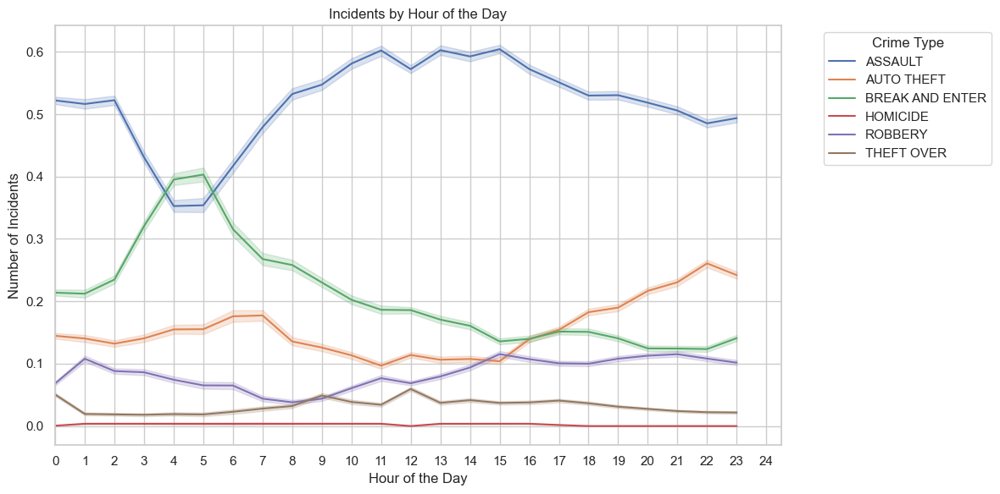

In [190]:
# List of crime types
crime_types = ["ASSAULT", "AUTO THEFT", "BREAK AND ENTER", "HOMICIDE", "ROBBERY", "THEFT OVER"]

# Plotting each crime type on the same plot
plt.figure(figsize=(12, 6))
for crime in crime_types:
    sns.lineplot(data=dfmatrix, x="OCC_HOUR", y=crime, label=crime)

plt.xlabel('Hour of the Day')
plt.ylabel('Number of Incidents')
plt.title('Incidents by Hour of the Day')

# Set x-axis limits from 0 to 24 and specify ticks
plt.xlim(0, 24.5)
plt.xticks(range(0, 25))

# Move the legend to the upper right corner outside the plot
plt.legend(title='Crime Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### Visualization of crimes by Year

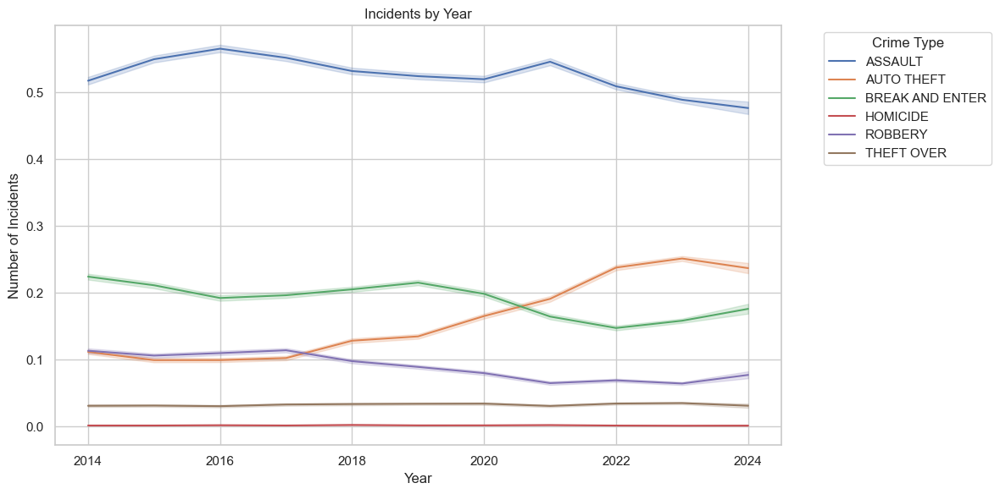

In [191]:
# List of crime types
crime_types = ["ASSAULT", "AUTO THEFT", "BREAK AND ENTER", "HOMICIDE", "ROBBERY", "THEFT OVER"]

# Plotting each crime type by year
plt.figure(figsize=(12, 6))
for crime in crime_types:
    sns.lineplot(data=dfmatrix, x="OCC_YEAR", y=crime, label=crime)

plt.xlabel('Year')
plt.ylabel('Number of Incidents')
plt.title('Incidents by Year')
plt.legend(title='Crime Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### Visualization of crimes by Month

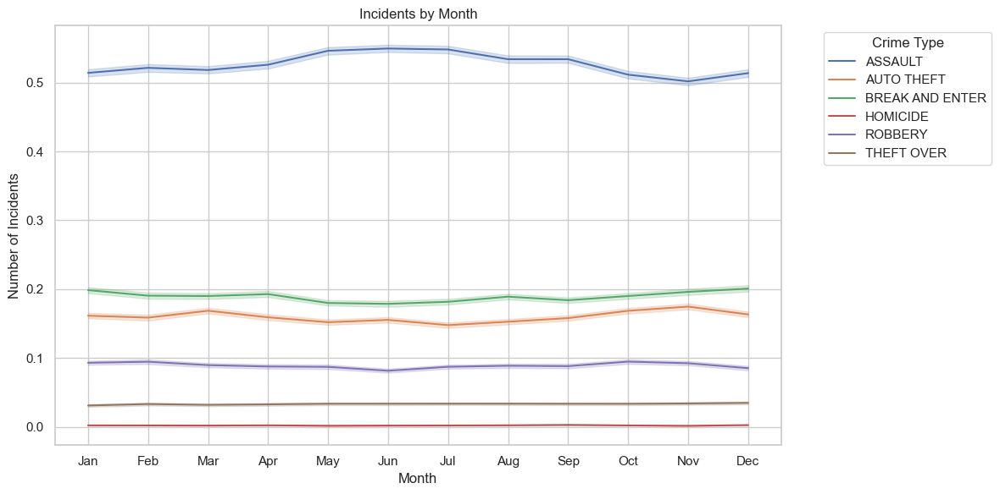

In [192]:
# Plotting each crime type by month
plt.figure(figsize=(12, 6))
for crime in crime_types:
    sns.lineplot(data=dfmatrix, x="OCC_MONTH_NUM", y=crime, label=crime)

plt.xlabel('Month')
plt.ylabel('Number of Incidents')
plt.title('Incidents by Month')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(title='Crime Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### Visualization of crimes by Day of the Week

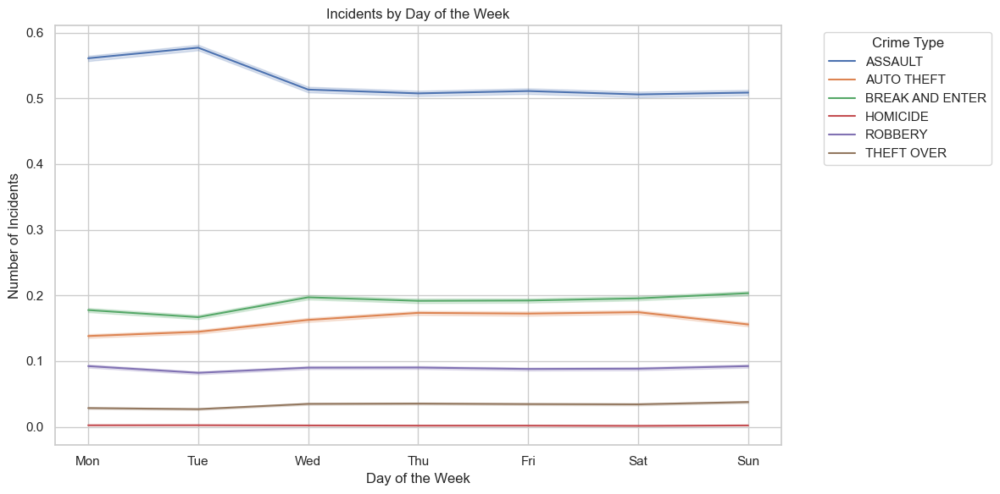

In [193]:
# Ensure OCC_DOW_NUM is in the correct range
dfmatrix['OCC_DOW_NUM'] = dfmatrix['OCC_DOW_NUM'] % 7

# List of crime types
crime_types = ["ASSAULT", "AUTO THEFT", "BREAK AND ENTER", "HOMICIDE", "ROBBERY", "THEFT OVER"]

# Plotting each crime type by day of the week
plt.figure(figsize=(12, 6))
for crime in crime_types:
    sns.lineplot(data=dfmatrix, x="OCC_DOW_NUM", y=crime, label=crime)

plt.xlabel('Day of the Week')
plt.ylabel('Number of Incidents')
plt.title('Incidents by Day of the Week')
plt.xticks(range(7), ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.legend(title='Crime Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### Visualization of crimes by Day of the Year

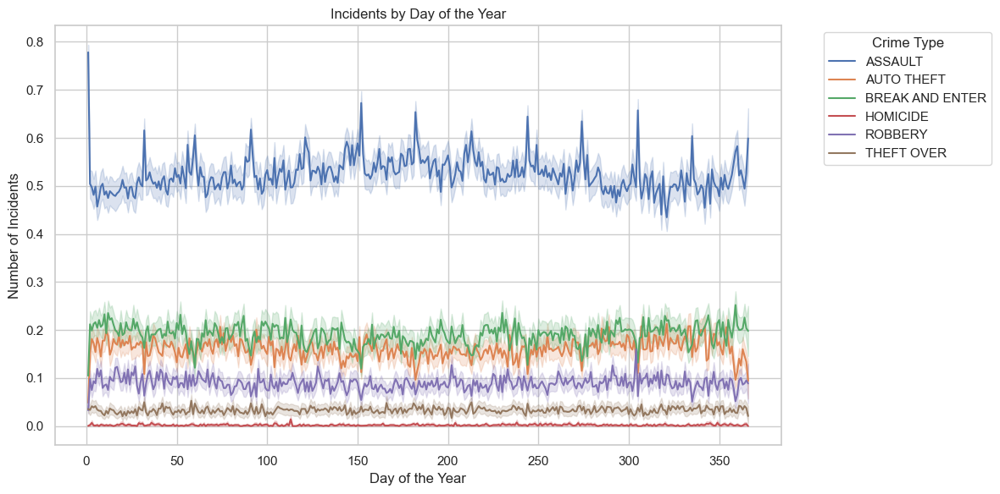

In [194]:
# Plotting each crime type by day of the year
plt.figure(figsize=(12, 6))
for crime in crime_types:
    sns.lineplot(data=dfmatrix, x="OCC_DOY", y=crime, label=crime)

plt.xlabel('Day of the Year')
plt.ylabel('Number of Incidents')
plt.title('Incidents by Day of the Year')
plt.legend(title='Crime Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### Visualization of crimes by Day of the Month

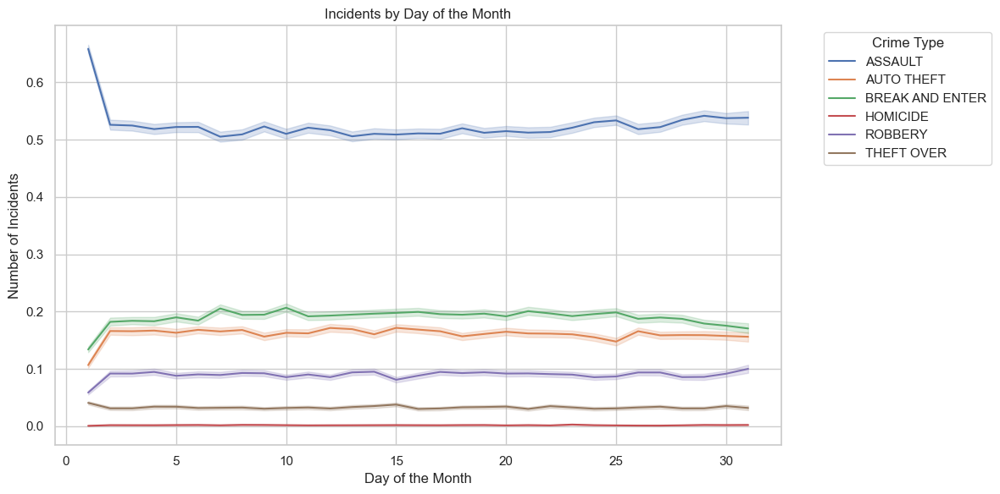

In [195]:
# Plotting each crime type by day of the month
plt.figure(figsize=(12, 6))
for crime in crime_types:
    sns.lineplot(data=dfmatrix, x="OCC_DAY", y=crime, label=crime)

plt.xlabel('Day of the Month')
plt.ylabel('Number of Incidents')
plt.title('Incidents by Day of the Month')
plt.legend(title='Crime Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


### Heatmap of Crimes Correlation

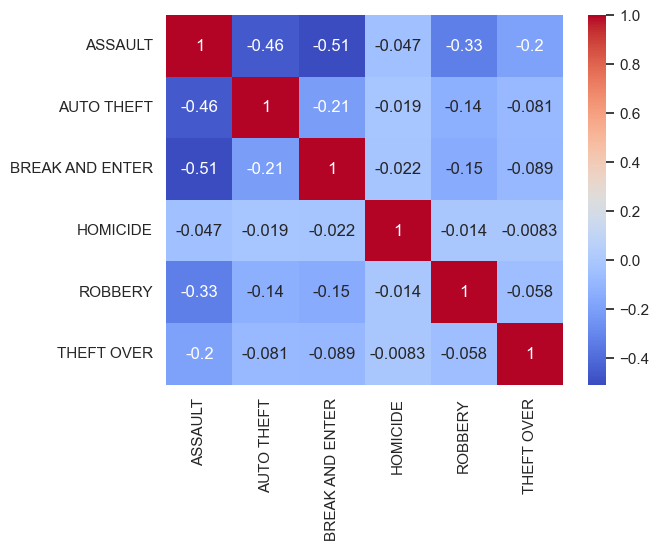

In [196]:
crime_columns = ["ASSAULT", "AUTO THEFT", "BREAK AND ENTER", "HOMICIDE", "ROBBERY", "THEFT OVER"]
corr = dfmatrix[crime_columns].corr()

sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.show()


# Geospatial Analysis

### ASSAULT HeatMap

In [197]:
# Define Toronto boundaries
north_boundary = 43.8554
south_boundary = 43.5810
east_boundary = -79.1161
west_boundary = -79.6393

# Sample 30% of the DataFrame
sampled_df = dfmatrix.sample(frac=1, random_state=42)

# Filter assaults within Toronto boundaries
toronto_assaults = sampled_df.query("ASSAULT == 1 and LAT_WGS84 >= @south_boundary and LAT_WGS84 <= @north_boundary and LONG_WGS84 >= @west_boundary and LONG_WGS84 <= @east_boundary")

# Extract latitude and longitude coordinates
locations = toronto_assaults[["LAT_WGS84", "LONG_WGS84"]].values.tolist()

# Create a colormap with better gradient
colormap = linear.YlOrRd_09.scale(0, toronto_assaults.shape[0])
colormap.caption = 'Assaults'

# Create a heatmap from latitude and longitude columns
heatmap = HeatMap(data=locations, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'yellow', 1: 'red'}, radius=15, blur=20)

# Create a map centered on Toronto
m = folium.Map(location=[(north_boundary + south_boundary) / 2, (east_boundary + west_boundary) / 2], zoom_start=10)

# Add heatmap to the map using the 'add_to' method
heatmap.add_to(m)

# Add colormap to the map
colormap.add_to(m)

# Add boundary rectangle to the map
folium.Rectangle(bounds=[[south_boundary, west_boundary], [north_boundary, east_boundary]], color='blue', fill=False).add_to(m)

# Display the map
m


### HOMICIDE HeatMap

In [198]:
# Define Toronto boundaries
north_boundary = 43.8554
south_boundary = 43.5810
east_boundary = -79.1161
west_boundary = -79.6393

# Sample 30% of the DataFrame
sampled_df = dfmatrix.sample(frac=1, random_state=42)

# Filter homicides within Toronto boundaries
toronto_homicides = sampled_df.query("HOMICIDE == 1 and LAT_WGS84 >= @south_boundary and LAT_WGS84 <= @north_boundary and LONG_WGS84 >= @west_boundary and LONG_WGS84 <= @east_boundary")

# Extract latitude and longitude coordinates
locations = toronto_homicides[["LAT_WGS84", "LONG_WGS84"]].values.tolist()

# Create a colormap with better gradient
colormap = linear.YlOrRd_09.scale(0, toronto_homicides.shape[0])
colormap.caption = 'Homicides'

# Create a heatmap from latitude and longitude columns
heatmap = HeatMap(data=locations, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'yellow', 1: 'red'}, radius=15, blur=20)

# Create a map centered on Toronto
m = folium.Map(location=[(north_boundary + south_boundary) / 2, (east_boundary + west_boundary) / 2], zoom_start=10)

# Add heatmap to the map using the 'add_to' method
heatmap.add_to(m)

# Add colormap to the map
colormap.add_to(m)

# Add boundary rectangle to the map
folium.Rectangle(bounds=[[south_boundary, west_boundary], [north_boundary, east_boundary]], color='blue', fill=False).add_to(m)

# Display the map
m


### AUTO THEFT HeatMap

In [199]:
# Define Toronto boundaries
north_boundary = 43.8554
south_boundary = 43.5810
east_boundary = -79.1161
west_boundary = -79.6393

# Sample 30% of the DataFrame
sampled_df = dfmatrix.sample(frac=1, random_state=42)

# Filter auto thefts within Toronto boundaries
toronto_auto_thefts = sampled_df.query("`AUTO THEFT` == 1 and LAT_WGS84 >= @south_boundary and LAT_WGS84 <= @north_boundary and LONG_WGS84 >= @west_boundary and LONG_WGS84 <= @east_boundary")

# Extract latitude and longitude coordinates
locations = toronto_auto_thefts[["LAT_WGS84", "LONG_WGS84"]].values.tolist()

# Create a colormap with better gradient
colormap = linear.YlOrRd_09.scale(0, toronto_auto_thefts.shape[0])
colormap.caption = 'Auto Thefts'

# Create a heatmap from latitude and longitude columns
heatmap = HeatMap(data=locations, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'yellow', 1: 'red'}, radius=15, blur=20)

# Create a map centered on Toronto
m = folium.Map(location=[(north_boundary + south_boundary) / 2, (east_boundary + west_boundary) / 2], zoom_start=10)

# Add heatmap to the map using the 'add_to' method
heatmap.add_to(m)

# Add colormap to the map
colormap.add_to(m)

# Add boundary rectangle to the map
folium.Rectangle(bounds=[[south_boundary, west_boundary], [north_boundary, east_boundary]], color='blue', fill=False).add_to(m)

# Display the map
m


### BREAK AND ENTER HeatMap

In [200]:
# Define Toronto boundaries
north_boundary = 43.8554
south_boundary = 43.5810
east_boundary = -79.1161
west_boundary = -79.6393

# Sample 30% of the DataFrame
sampled_df = dfmatrix.sample(frac=1, random_state=42)

# Filter break and enter incidents within Toronto boundaries
toronto_break_enter = sampled_df.query("`BREAK AND ENTER` == 1 and LAT_WGS84 >= @south_boundary and LAT_WGS84 <= @north_boundary and LONG_WGS84 >= @west_boundary and LONG_WGS84 <= @east_boundary")

# Extract latitude and longitude coordinates
locations = toronto_break_enter[["LAT_WGS84", "LONG_WGS84"]].values.tolist()

# Create a colormap with better gradient
colormap = linear.YlOrRd_09.scale(0, toronto_break_enter.shape[0])
colormap.caption = 'Break and Enter Incidents'

# Create a heatmap from latitude and longitude columns
heatmap = HeatMap(data=locations, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'yellow', 1: 'red'}, radius=15, blur=20)

# Create a map centered on Toronto
m = folium.Map(location=[(north_boundary + south_boundary) / 2, (east_boundary + west_boundary) / 2], zoom_start=10)

# Add heatmap to the map using the 'add_to' method
heatmap.add_to(m)

# Add colormap to the map
colormap.add_to(m)

# Add boundary rectangle to the map
folium.Rectangle(bounds=[[south_boundary, west_boundary], [north_boundary, east_boundary]], color='blue', fill=False).add_to(m)

# Display the map
m


### ROBBERY HeatMap

In [201]:
# Define Toronto boundaries
north_boundary = 43.8554
south_boundary = 43.5810
east_boundary = -79.1161
west_boundary = -79.6393

# Sample 30% of the DataFrame
sampled_df = dfmatrix.sample(frac=1, random_state=42)

# Filter robbery incidents within Toronto boundaries
toronto_robbery = sampled_df.query("ROBBERY == 1 and LAT_WGS84 >= @south_boundary and LAT_WGS84 <= @north_boundary and LONG_WGS84 >= @west_boundary and LONG_WGS84 <= @east_boundary")

# Extract latitude and longitude coordinates
locations = toronto_robbery[["LAT_WGS84", "LONG_WGS84"]].values.tolist()

# Create a colormap with better gradient
colormap = linear.YlOrRd_09.scale(0, toronto_robbery.shape[0])
colormap.caption = 'Robbery Incidents'

# Create a heatmap from latitude and longitude columns
heatmap = HeatMap(data=locations, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'yellow', 1: 'red'}, radius=15, blur=20)

# Create a map centered on Toronto
m = folium.Map(location=[(north_boundary + south_boundary) / 2, (east_boundary + west_boundary) / 2], zoom_start=10)

# Add heatmap to the map using the 'add_to' method
heatmap.add_to(m)

# Add colormap to the map
colormap.add_to(m)

# Add boundary rectangle to the map
folium.Rectangle(bounds=[[south_boundary, west_boundary], [north_boundary, east_boundary]], color='blue', fill=False).add_to(m)

# Display the map
m


### THEFT OVER HeatMap

In [202]:
# Define Toronto boundaries
north_boundary = 43.8554
south_boundary = 43.5810
east_boundary = -79.1161
west_boundary = -79.6393

# Sample 30% of the DataFrame
sampled_df = dfmatrix.sample(frac=1, random_state=42)

# Filter theft over incidents within Toronto boundaries
toronto_theft_over = sampled_df.query("`THEFT OVER` == 1 and LAT_WGS84 >= @south_boundary and LAT_WGS84 <= @north_boundary and LONG_WGS84 >= @west_boundary and LONG_WGS84 <= @east_boundary")

# Extract latitude and longitude coordinates
locations = toronto_theft_over[["LAT_WGS84", "LONG_WGS84"]].values.tolist()

# Create a colormap with better gradient
colormap = linear.YlOrRd_09.scale(0, toronto_theft_over.shape[0])
colormap.caption = 'Theft Over Incidents'

# Create a heatmap from latitude and longitude columns
heatmap = HeatMap(data=locations, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'yellow', 1: 'red'}, radius=15, blur=20)

# Create a map centered on Toronto
m = folium.Map(location=[(north_boundary + south_boundary) / 2, (east_boundary + west_boundary) / 2], zoom_start=10)

# Add heatmap to the map using the 'add_to' method
heatmap.add_to(m)

# Add colormap to the map
colormap.add_to(m)

# Add boundary rectangle to the map
folium.Rectangle(bounds=[[south_boundary, west_boundary], [north_boundary, east_boundary]], color='blue', fill=False).add_to(m)

# Display the map
m


### WordCloud for Day of the Week

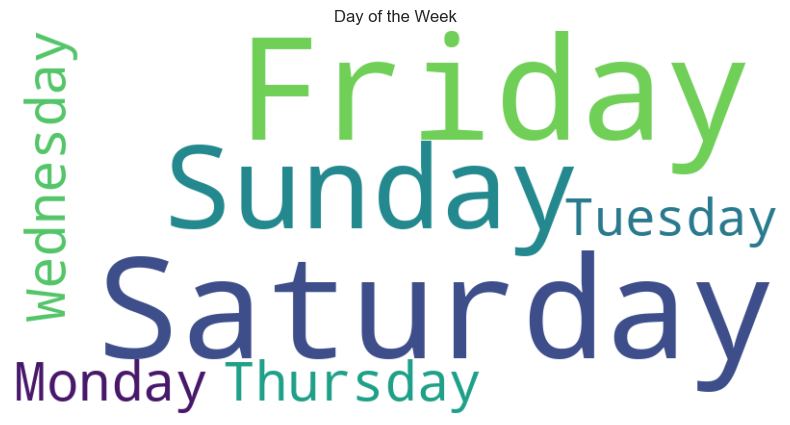

In [203]:
# Strip whitespace from the 'OCC_DOW' column
dfmatrix['OCC_DOW'] = dfmatrix['OCC_DOW'].str.strip()



# Ensure there are no NaN values in the 'OCC_DOW' column
dfmatrix['OCC_DOW'] = dfmatrix['OCC_DOW'].fillna('')

# Convert the 'OCC_DOW' column to a list of strings
text_data = dfmatrix['OCC_DOW'].tolist()

# Count the frequency of each unique word
word_freq = Counter(text_data)

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Day of the Week')
plt.show()

### Period of the Day

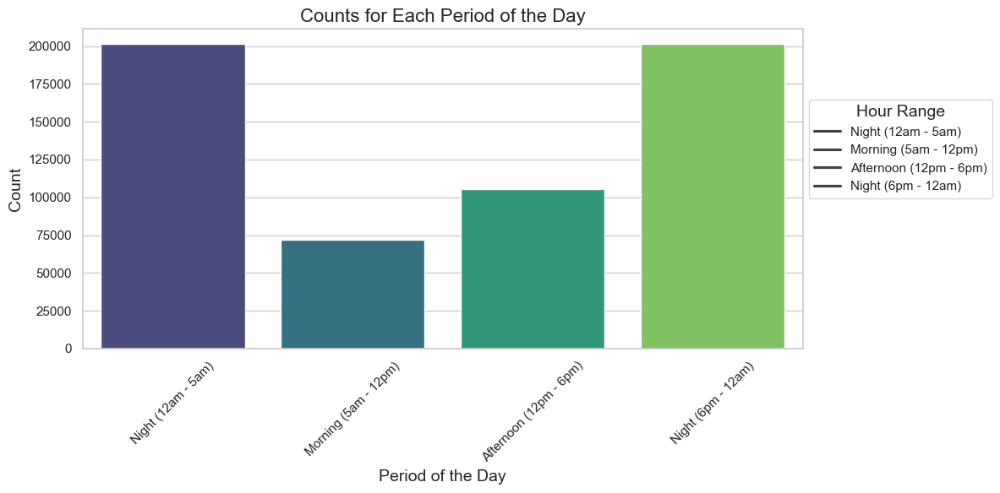

In [204]:
# Data for PERIOD_OF_THE_DAY
data = {
    'PERIOD_OF_THE_DAY': ['Night (12am - 5am)', 'Morning (5am - 12pm)', 'Afternoon (12pm - 6pm)', 'Night (6pm - 12am)'],
    'Count': [201146, 71721, 105223, 201146]  # Update with actual counts if different
}

# Create DataFrame
df_period_of_the_day = pd.DataFrame(data)

# Set the plot style
sns.set(style="whitegrid")

# Create the bar plot
plt.figure(figsize=(12, 6))
barplot = sns.barplot(x='PERIOD_OF_THE_DAY', y='Count', hue='PERIOD_OF_THE_DAY', data=df_period_of_the_day, palette='viridis', dodge=False)

# Add title and labels
plt.title('Counts for Each Period of the Day', fontsize=16)
plt.xlabel('Period of the Day', fontsize=14)
plt.ylabel('Count', fontsize=14)

# Rotate x labels for better readability
plt.xticks(rotation=45)

# Add custom legend
legend_text = [
    'Night (12am - 5am)',
    'Morning (5am - 12pm)',
    'Afternoon (12pm - 6pm)',
    'Night (6pm - 12am)'
]
plt.legend(legend_text, title='Hour Range', title_fontsize='14', loc='upper left', bbox_to_anchor=(1, 0.8))

# Display the plot
plt.tight_layout()
plt.show()


### Period of the the Month

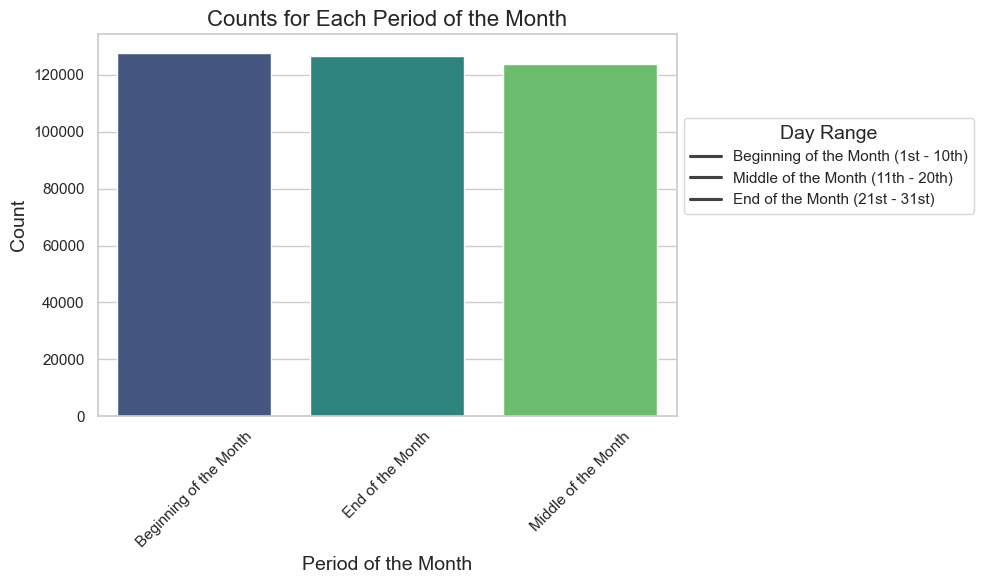

In [205]:
# Data for PERIOD_OF_THE_MONTH
data = {
    'PERIOD_OF_THE_MONTH': ['Beginning of the Month', 'End of the Month', 'Middle of the Month'],
    'Count': [127758, 126699, 123633]
}

# Create DataFrame
df_period_of_the_month = pd.DataFrame(data)

# Set the plot style
sns.set(style="whitegrid")

# Create the bar plot
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x='PERIOD_OF_THE_MONTH', y='Count', hue='PERIOD_OF_THE_MONTH', data=df_period_of_the_month, palette='viridis', dodge=False)

# Add title and labels
plt.title('Counts for Each Period of the Month', fontsize=16)
plt.xlabel('Period of the Month', fontsize=14)
plt.ylabel('Count', fontsize=14)

# Rotate x labels for better readability
plt.xticks(rotation=45)

# Add custom legend
legend_text = [
    'Beginning of the Month (1st - 10th)',
    'Middle of the Month (11th - 20th)',
    'End of the Month (21st - 31st)'
]
plt.legend(legend_text, title='Day Range', title_fontsize='14', loc='upper left', bbox_to_anchor=(1, 0.8))

# Display the plot
plt.tight_layout()
plt.show()


### Period of the the Week

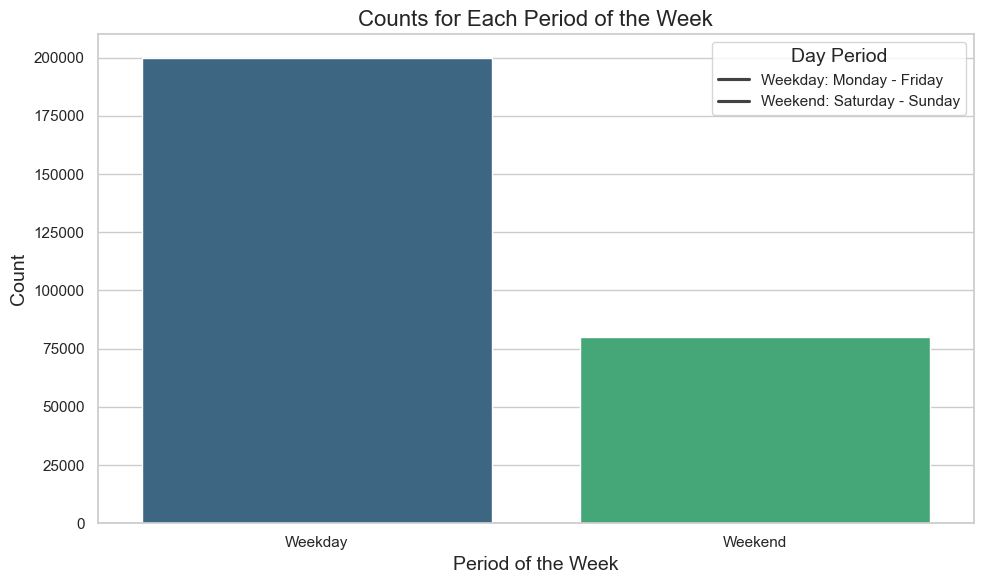

In [206]:
# Data for PERIOD_OF_THE_WEEK
data = {
    'PERIOD_OF_THE_WEEK': ['Weekday', 'Weekend'],
    'Count': [200000, 80000]  # Replace with actual counts if different
}

# Create DataFrame
df_period_of_the_week = pd.DataFrame(data)

# Set the plot style
sns.set(style="whitegrid")

# Create the bar plot
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x='PERIOD_OF_THE_WEEK', y='Count', hue='PERIOD_OF_THE_WEEK', data=df_period_of_the_week, palette='viridis', dodge=False)

# Add title and labels
plt.title('Counts for Each Period of the Week', fontsize=16)
plt.xlabel('Period of the Week', fontsize=14)
plt.ylabel('Count', fontsize=14)

# Add custom legend
legend_text = ['Weekday: Monday - Friday', 'Weekend: Saturday - Sunday']
plt.legend(legend_text, title='Day Period', title_fontsize='14')

# Display the plot
plt.tight_layout()
plt.show()


### Year Categorization

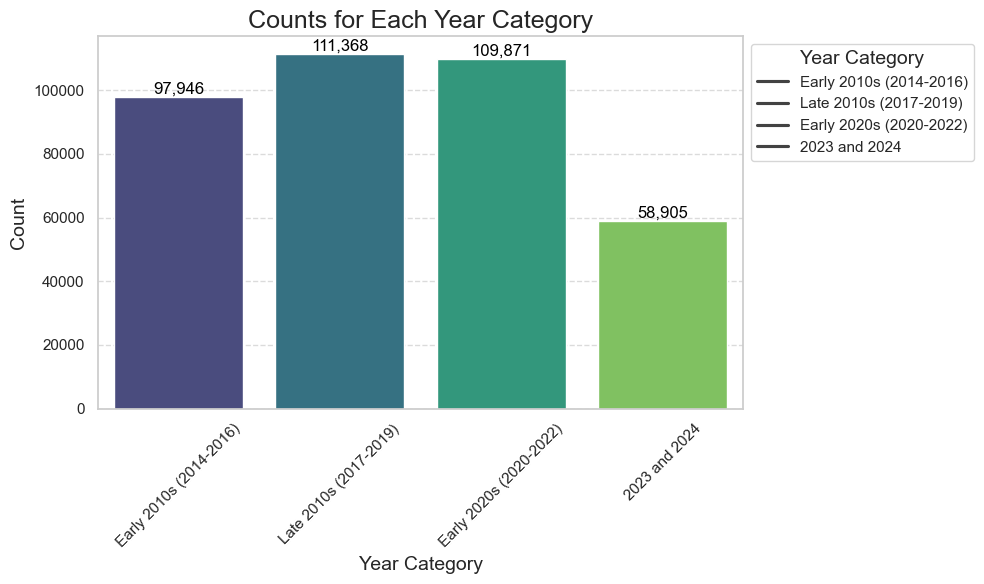

In [207]:
# Data for YEAR_CATEGORY
data = {
    'YEAR_CATEGORY': ['Early 2010s (2014-2016)', 'Late 2010s (2017-2019)', 'Early 2020s (2020-2022)', '2023 and 2024'],
    'Count': [97946, 111368, 109871, 58905]
}

# Create DataFrame
df_year_category = pd.DataFrame(data)

# Set the plot style
sns.set(style="whitegrid")

# Create the bar plot, set `x` as `hue` to comply with new Seaborn version
plt.figure(figsize=(10, 6))
barplot = sns.barplot(
    x='YEAR_CATEGORY',
    y='Count',
    hue='YEAR_CATEGORY',  # Assign x to hue for color mapping
    data=df_year_category,
    palette='viridis',  # Use a palette for the bars
    dodge=False,
    legend=False  # Disable the redundant legend
)

# Add title and labels
plt.title('Counts for Each Year Category', fontsize=18)
plt.xlabel('Year Category', fontsize=14)
plt.ylabel('Count', fontsize=14)

# Rotate x labels for better readability
plt.xticks(rotation=45)

# Add data labels on top of each bar
for index, row in df_year_category.iterrows():
    barplot.text(
        index,
        row.Count + 1000,  # Positioning the text slightly above the bar
        f'{row.Count:,}',  # Formatting the number with commas
        color='black',
        ha="center",
        fontsize=12
    )

# Add a custom legend separately to maintain clarity
legend_text = ['Early 2010s (2014-2016)', 'Late 2010s (2017-2019)', 'Early 2020s (2020-2022)', '2023 and 2024']
plt.legend(
    legend_text,
    title='Year Category',
    title_fontsize='14',
    loc='upper left',
    bbox_to_anchor=(1, 1)
)

# Add grid lines for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot with a tidy layout
plt.tight_layout()
plt.show()


### Crimes Visualization per Season

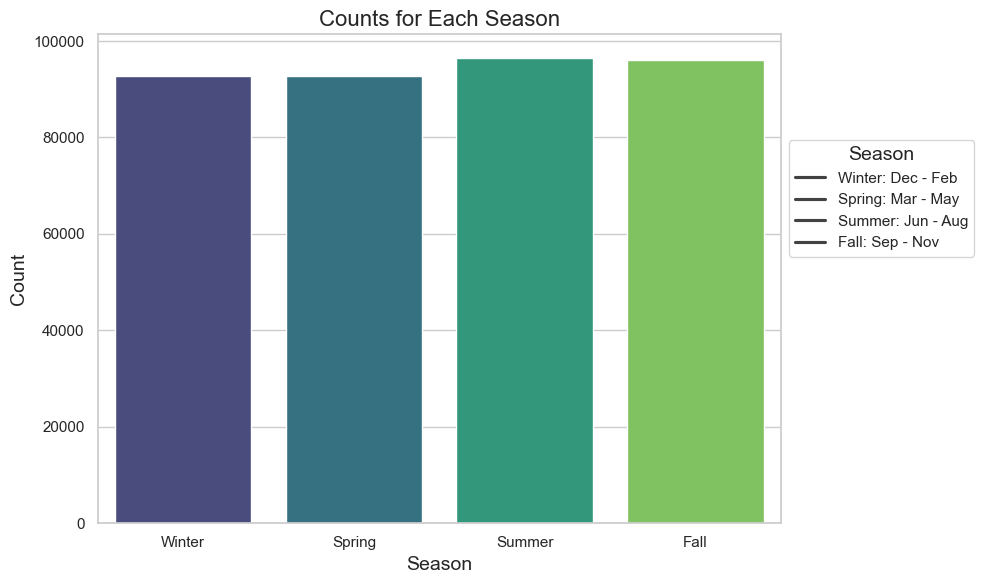

In [208]:
# Monthly counts
monthly_counts = {
    'January': 32820,
    'February': 29567,
    'March': 32382,
    'April': 28742,
    'May': 31593,
    'June': 31628,
    'July': 32523,
    'August': 32406,
    'September': 31678,
    'October': 32740,
    'November': 31661,
    'December': 30350
}

# Categorize months into seasons
seasons = {
    'Winter': ['December', 'January', 'February'],
    'Spring': ['March', 'April', 'May'],
    'Summer': ['June', 'July', 'August'],
    'Fall': ['September', 'October', 'November']
}

# Calculate counts for each season
season_counts = {season: sum(monthly_counts[month] for month in months) for season, months in seasons.items()}

# Create DataFrame
df_seasons = pd.DataFrame(list(season_counts.items()), columns=['Season', 'Count'])

# Set the plot style
sns.set(style="whitegrid")

# Create the bar plot
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x='Season', y='Count', hue='Season', data=df_seasons, palette='viridis', dodge=False)

# Add title and labels
plt.title('Counts for Each Season', fontsize=16)
plt.xlabel('Season', fontsize=14)
plt.ylabel('Count', fontsize=14)

# Add custom legend
legend_text = ['Winter: Dec - Feb', 'Spring: Mar - May', 'Summer: Jun - Aug', 'Fall: Sep - Nov']
plt.legend(legend_text, title='Season', title_fontsize='14', loc='upper left', bbox_to_anchor=(1, 0.8))

# Display the plot
plt.tight_layout()
plt.show()


/var/folders/33/7yzzx5qj4hq4pqr3jnrjz3mh0000gn/T/ipykernel_29838/1535265021.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(


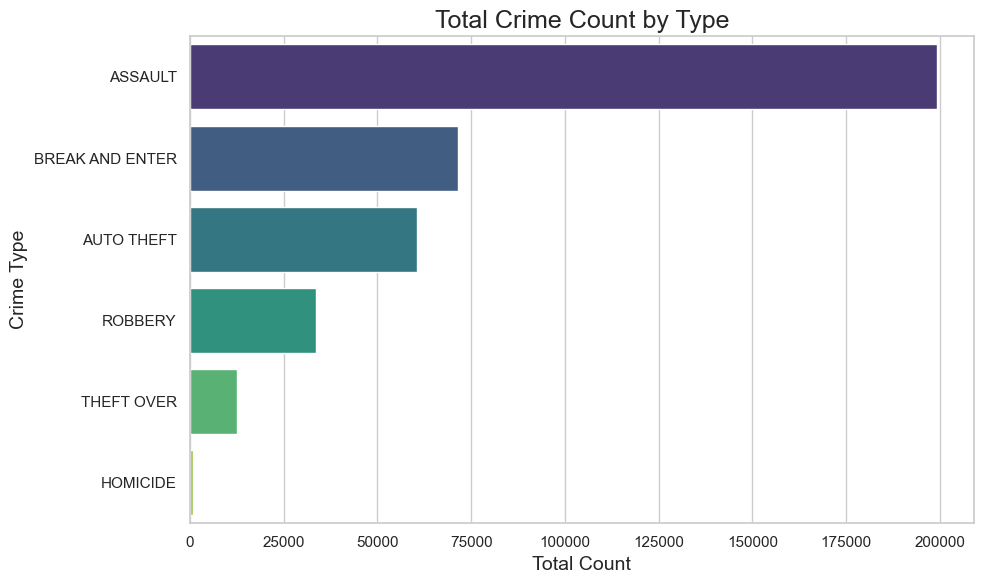

In [209]:
# Aggregate the total counts for each crime type
crime_columns = ['ASSAULT', 'AUTO THEFT', 'BREAK AND ENTER', 'HOMICIDE', 'ROBBERY', 'THEFT OVER']
total_counts = dfmatrix[crime_columns].sum().reset_index()

# Rename the columns for clarity
total_counts.columns = ['Crime Type', 'Total Count']

# Sort by count for better visualization
total_counts = total_counts.sort_values(by='Total Count', ascending=False)  # Use descending order

# Set plot style
sns.set(style="whitegrid")

# Create the horizontal bar plot
plt.figure(figsize=(10, 6))
barplot = sns.barplot(
    x='Total Count',
    y='Crime Type',
    data=total_counts,
    orient='h',  # Horizontal orientation
    palette='viridis'  # Use a palette for the bars
)

# Add title and labels
plt.title('Total Crime Count by Type', fontsize=18)
plt.xlabel('Total Count', fontsize=14)
plt.ylabel('Crime Type', fontsize=14)

# Display the plot with a tidy layout
plt.tight_layout()
plt.show()
